# AutoEncoders

__Auto__ - Self  
__Encode__ - convert into a different form (Typically simpler or reduced dimensional form).  
__Autoencoder = system that teacher itself how to encode information.__

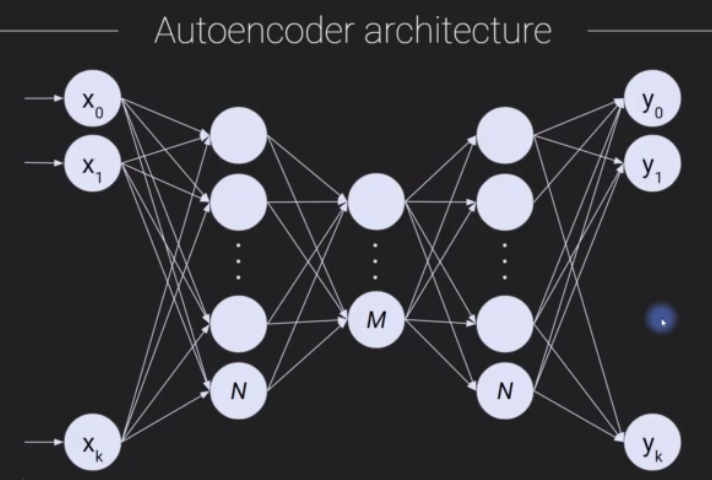

__Number of ip units = Number of op units__

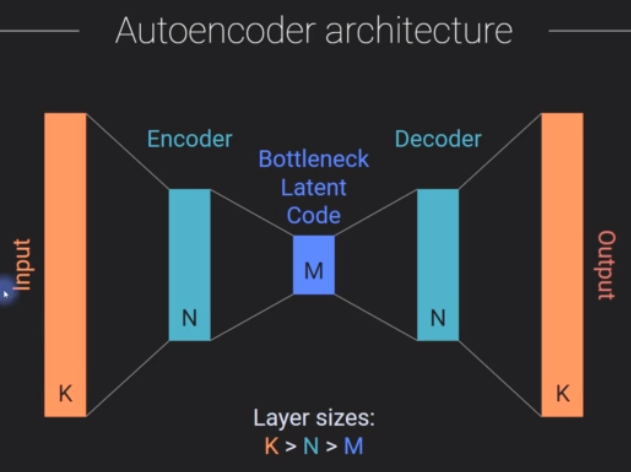

__Always exactly one ip, op and bottleneck layer(in the middle on network)__

__Goal of Autoencoder - Get output to match input__. Train the model such that the output of the model is matching as close to input as possible.

Loss function typically used - __MSE__. If data is scaled between 0 and 1, then __Cross Entropy Loss__ is also possibly used.

#### Applications:
- Data Compression or dimension reduction
- Data cleaning (Denoising, despeckling, occlusion)
- Feature extraction
- Anomaly/fraud detection
- Pretraining deep or complex models

# Denoising MNIST

In [1]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F

import matplotlib.pyplot as plt
from IPython import display
display.set_matplotlib_formats('svg')

/tmp/ipykernel_31959/2247113016.py:8: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  display.set_matplotlib_formats('svg')


In [2]:
import numpy as np
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset

from sklearn.model_selection import train_test_split

from IPython import display
display.set_matplotlib_formats('svg')

data = np.loadtxt(open('../data/mnist_train_small.csv', 'rb'), delimiter=',')

labels = data[:, 0]
data = data[:, 1:]

# normalizing data to a range of 0-1

dataNorm = data/np.max(data)

dataT = torch.tensor(dataNorm).float()

In [3]:
def createMNISTAE():
    
    class AENet(nn.Module):
        def __init__(self):
            super().__init__()
            self.ip = nn.Linear(784, 250) # input layer
            self.enc = nn.Linear(250, 50) # encoder layer
            self.lat = nn.Linear(50, 250) # latent layer
            self.dec = nn.Linear(250, 784) # decoder layer - op is same as ip
        
        def forward(self, x):
            x = F.relu(self.ip(x))
            x = F.relu(self.enc(x))
            x = F.relu(self.lat(x))
            return torch.sigmoid(self.dec(x)) # as ip data is in 0-1, op should be in same numerical range as ip
            
    net = AENet()
    
    lossfn = nn.MSELoss()
    optim = torch.optim.Adam(net.parameters(), lr=.001)
    
    return net, lossfn, optim

In [4]:
# testing model

net, lossfn, optim = createMNISTAE()

X = dataT[:5, :]
yH = net(X)

print(X.shape, yH.shape)

torch.Size([5, 784]) torch.Size([5, 784])


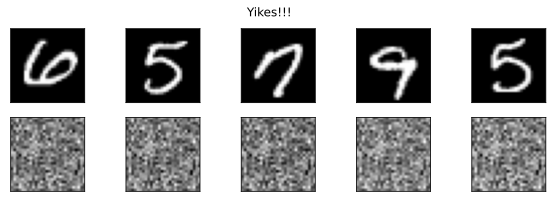

In [5]:
# let's see what the model did!
fig,axs = plt.subplots(2,5,figsize=(10,3))

for i in range(5):
    axs[0,i].imshow(X[i,:].view(28,28).detach() ,cmap='gray')
    axs[1,i].imshow(yH[i,:].view(28,28).detach() ,cmap='gray')
    axs[0,i].set_xticks([]), axs[0,i].set_yticks([])
    axs[1,i].set_xticks([]), axs[1,i].set_yticks([])
  
plt.suptitle('Yikes!!!')
plt.show()

### Function to train the model

In [6]:
def trainModel():
    nEp = 10000

    net, lossfn, optim = createMNISTAE()
    losses = torch.zeros(nEp)

    for i in range(nEp):
        randIdx = np.random.choice(dataT.shape[0], size=32) # slecting a random set of images
        X = dataT[randIdx, :]

        # forward pass
        yH = net(X)
        loss = lossfn(yH, X) # data itself is a label

        # backprop
        optim.zero_grad()
        loss.backward()
        optim.step()

        losses[i] = loss.item()

    return losses, net

Final loss: 0.0090


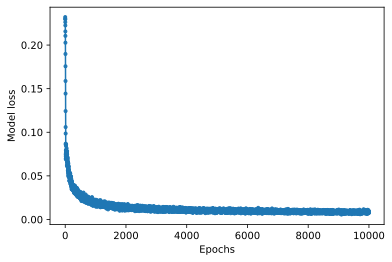

In [7]:
# train the model
losses,net = trainModel()
print(f'Final loss: {losses[-1]:.4f}')

# visualize the losses
plt.plot(losses,'.-')
plt.xlabel('Epochs')
plt.ylabel('Model loss')
plt.show()

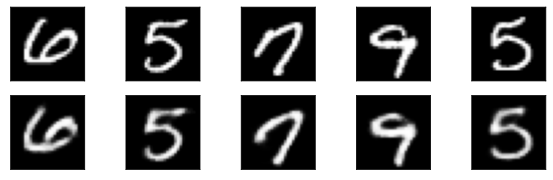

In [8]:
# plotting results from AE
X = dataT[:5, :]
yH = net(X)

fig,axs = plt.subplots(2,5,figsize=(10,3))

for i in range(5):
    axs[0,i].imshow(X[i,:].view(28,28).detach() ,cmap='gray')
    axs[1,i].imshow(yH[i,:].view(28,28).detach() ,cmap='gray')
    axs[0,i].set_xticks([]), axs[0,i].set_yticks([])
    axs[1,i].set_xticks([]), axs[1,i].set_yticks([])
  
# plt.suptitle('Yikes!!!')
plt.show()

### Adding Noise to see usecase of AE

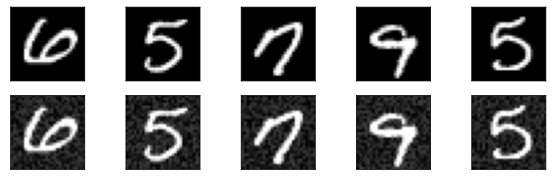

In [9]:
X = dataT[:10, :]     # selecting random images

Xnoise = X + torch.rand_like(X)/4   # adding noise to data

Xnoise[Xnoise > 1] = 1    # clipping any values > 1 to 1 after adding noise

fig,axs = plt.subplots(2,5,figsize=(10,3))

for i in range(5):
    axs[0,i].imshow(X[i,:].view(28,28).detach() ,cmap='gray')
    axs[1,i].imshow(Xnoise[i,:].view(28,28).detach() ,cmap='gray')
    axs[0,i].set_xticks([]), axs[0,i].set_yticks([])
    axs[1,i].set_xticks([]), axs[1,i].set_yticks([])
    
plt.show()

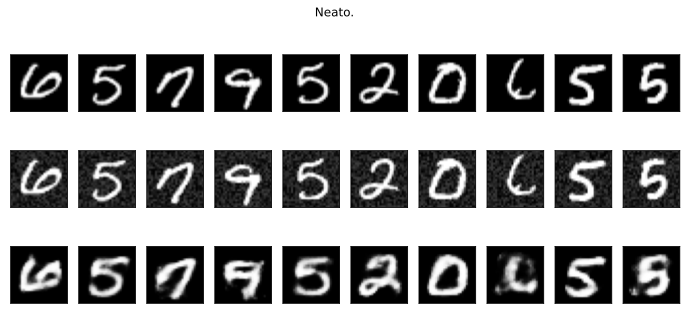

In [10]:
# running it through model

Y = net(Xnoise)

# show the noisy images
fig,axs = plt.subplots(3,10,figsize=(12,5))

for i in range(10):
    axs[0,i].imshow(X[i,:].view(28,28).detach() ,cmap='gray')
    axs[1,i].imshow(Xnoise[i,:].view(28,28).detach() ,cmap='gray')
    axs[2,i].imshow(Y[i,:].view(28,28).detach() ,cmap='gray')
    axs[0,i].set_xticks([]), axs[0,i].set_yticks([])
    axs[1,i].set_xticks([]), axs[1,i].set_yticks([])
    axs[2,i].set_xticks([]), axs[2,i].set_yticks([])

plt.suptitle('Neato.')
plt.show()

# Autoencoders for Occlusion

In [1]:
import numpy as np
import matplotlib.pyplot as plt

import copy
import warnings
warnings.filterwarnings('ignore')

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset

from sklearn.model_selection import train_test_split

from IPython import display
display.set_matplotlib_formats('svg')

data = np.loadtxt(open('../data/mnist_train_small.csv', 'rb'), delimiter=',')

labels = data[:, 0]
data = data[:, 1:]

# normalizing data to a range of 0-1

dataNorm = data/np.max(data)

dataT = torch.tensor(dataNorm).float()

### Demonstration of Occlusion implementation

Train an Autoencoder model on original images, and give occluded images for reconstruction

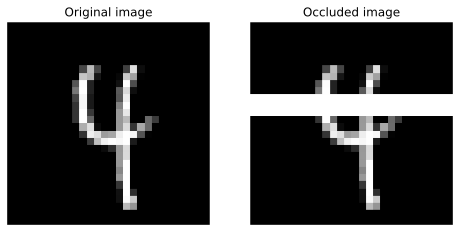

In [2]:
# Taking a sample image
img = dataT[12345, :].view(28, 28)

occluded = copy.deepcopy(img)
occluded[10:13, :] = 1 # drawwing a white stripe from 10th to 12th row

fig,ax = plt.subplots(1,2,figsize=(8,5))

ax[0].imshow(img,cmap='gray')
ax[0].set_title('Original image')
ax[0].axis('off')

ax[1].imshow(occluded,cmap='gray')
ax[1].set_title('Occluded image')
ax[1].axis('off')

plt.show()

In [3]:
def createMNISTAE():
    
    class AENet(nn.Module):
        def __init__(self):
            super().__init__()
            self.ip = nn.Linear(784, 128) # input layer
            self.enc = nn.Linear(128, 50) # encoder layer
            self.lat = nn.Linear(50, 128) # latent layer
            self.dec = nn.Linear(128, 784) # decoder layer - op is same as ip
        
        def forward(self, x):
            x = F.relu(self.ip(x))
            x = F.relu(self.enc(x))
            x = F.relu(self.lat(x))
            return torch.sigmoid(self.dec(x)) # as ip data is in 0-1, op should be in same numerical range as ip
            
    net = AENet()
    
    lossfn = nn.MSELoss()
    optim = torch.optim.Adam(net.parameters(), lr=.001)
    
    return net, lossfn, optim

In [4]:
def trainModel():
    nEp = 5

    net, lossfn, optim = createMNISTAE()
    losses = []
    
    bs = 32 # batch size
    numBatches = int(dataT.shape[0]/bs)

    for i in range(nEp):
        randIdx = np.random.permutation(dataT.shape[0]).astype(int) # slecting a random set of images
        
        batchLosses = []
        
        for bi in range(numBatches):
            
            # non-overlapping samples to use in this batch
            samps2use = range((bi-1)*bs,bi*bs)
            
            # training on original data
            X = dataT[randIdx[samps2use], :]
            
            # forward pass
            yH = net(X)
            loss = lossfn(yH, X) # data itself is a label

            # backprop
            optim.zero_grad()
            loss.backward()
            optim.step()
            
            batchLosses.append(loss.item())

        losses.append(np.mean(batchLosses[-3:]))

    return losses, net

Final loss : 0.0134


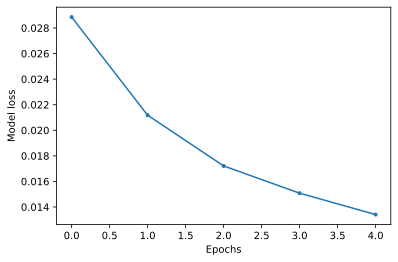

In [5]:
losses, net = trainModel()
print(f'Final loss : {losses[-1]:.4f}')

plt.plot(losses, '.-')
plt.xlabel('Epochs')
plt.ylabel('Model loss')
plt.show()

### Adding occlusion to images

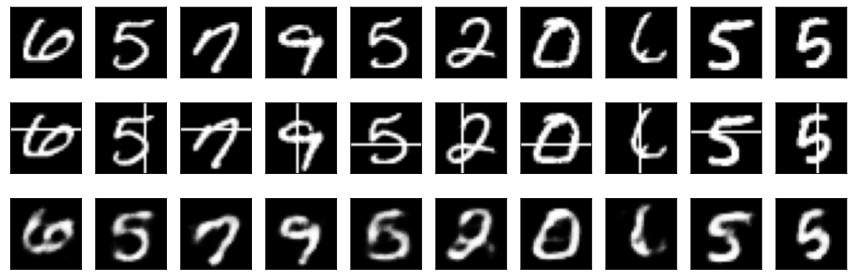

In [6]:
# small set of images
X = copy.deepcopy(dataT[:10, :])

# add noise

for i in range(X.shape[0]):
    img = X[i,:].view(28,28)
    
    # occlude random rows or columns
    start = np.random.choice(range(10, 21))
    
    if not i%2: # even -> horizontal occlusion
        img[start:start+1, :] = 1
    else:
        img[:,start:start+1] = 1


# run them through model
deOccluded = net(X)

# show the noisy images
fig,axs = plt.subplots(3,10,figsize=(15,5))

for i in range(10):
    axs[0,i].imshow(dataT[i,:].view(28,28).detach() ,cmap='gray')
    axs[1,i].imshow(X[i,:].view(28,28).detach() ,cmap='gray')
    axs[2,i].imshow(deOccluded[i,:].view(28,28).detach() ,cmap='gray')
    axs[0,i].set_xticks([]), axs[0,i].set_yticks([])
    axs[1,i].set_xticks([]), axs[1,i].set_yticks([])
    axs[2,i].set_xticks([]), axs[2,i].set_yticks([])
    
plt.show()

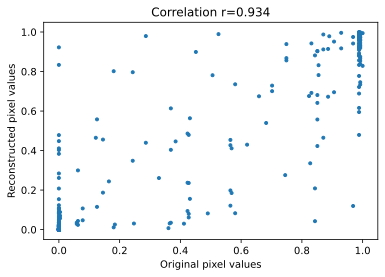

In [7]:
# We can quantify the performance of our "de-occluder" by correlating the sample with the original.

inOutCorr = np.corrcoef(dataT[9,:].detach(),deOccluded[9,:].detach())

# and plot
plt.plot(dataT[9,:].detach(),deOccluded[9,:].detach(),'.')
plt.xlabel('Original pixel values')
plt.ylabel('Reconstructed pixel values')
plt.title(f'Correlation r={ inOutCorr[0,1] :.3f}')
plt.show()

Above co-efficient is not fair enough as it also includes 0s while calculating tthe corr-coef. Hence, we have to checck corr-coef without zero valued pixels

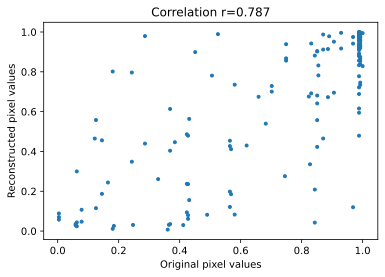

In [8]:
# trying without zero valued pixels

orig = dataT[9,:].detach()
recon = deOccluded[9,:].detach()

# bool vector to indicate pixels > 0 (with some tolerance) 
tol = 1e-4
nonZero = (orig > tol) & (recon > tol) # select pixels whose values are above tolerance

# recomputing correlation

inOutCorr = np.corrcoef(orig[nonZero], recon[nonZero])

# and plot
plt.plot(orig[nonZero],recon[nonZero],'.')
plt.xlabel('Original pixel values')
plt.ylabel('Reconstructed pixel values')
plt.title(f'Correlation r={ inOutCorr[0,1] :.3f}')
plt.show()

We have to check the reason behind the (low-quality) output is due to occlusion or due to Autoencoder default performance. For that, we check the autoencoder performance without occlusion

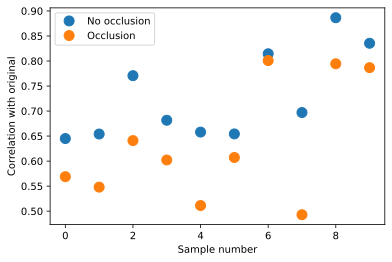

In [9]:
# Run non-occluded images through AE

noOcclusion = net(dataT[:10,:])

# compare correlation of deOccluded and non-Occluded outputs

r = np.zeros((10,2))

for i in range(deOccluded.shape[0]):
    
    # pixel selection (using same tolerance) 
    nonZero = (dataT[i,:] > tol) & (noOcclusion[i,:] > tol) & (deOccluded[i,:] > tol)
    
    # computing correlations
    r[i,0] = np.corrcoef(dataT[i,nonZero].detach(), noOcclusion[i,nonZero].detach())[0,1]
    r[i,1] = np.corrcoef(dataT[i,nonZero].detach(), deOccluded[i,nonZero].detach())[0,1]
    
# plot the correlation coefficients
plt.plot(r,'o',markersize=10)
plt.legend(['No occlusion','Occlusion'])
plt.xlabel('Sample number')
plt.ylabel('Correlation with original')
plt.show()

Above plot shows that the occlusion does reduce the quality of performance of AE, however, AE by itself is not performing that great without occlusion

# Latent Code of MNIST

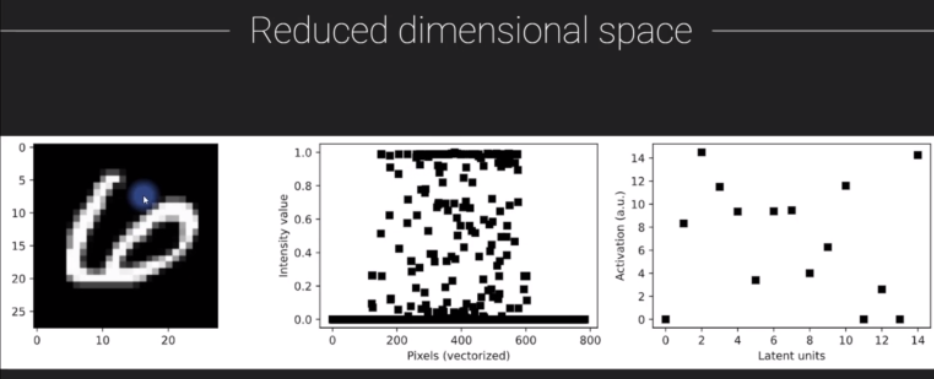

In [1]:
import numpy as np
import matplotlib.pyplot as plt

import copy
import warnings
warnings.filterwarnings('ignore')

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset

from sklearn.decomposition import PCA

from IPython import display
display.set_matplotlib_formats('svg')

In [2]:
data = np.loadtxt(open('../data/mnist_train_small.csv', 'rb'), delimiter=',')

labels = data[:, 0]
data = data[:, 1:]

# normalizing data to a range of 0-1

dataNorm = data/np.max(data)

dataT = torch.tensor(dataNorm).float()

In [3]:
def createMNISTAE():
    
    class AENet(nn.Module):
        def __init__(self):
            super().__init__()
            self.ip = nn.Linear(784, 150) # input layer
            self.enc = nn.Linear(150, 15) # encoder layer
            self.lat = nn.Linear(15, 150) # latent layer
            self.dec = nn.Linear(150, 784) # decoder layer - op is same as ip
        
        def forward(self, x):
            x = F.relu(self.ip(x))
            codex = F.relu(self.enc(x)) # to output hidden layer activation
            x = F.relu(self.lat(codex))
            y = torch.sigmoid(self.dec(x)) # as ip data is in 0-1, op should be in same numerical range as ip, hence sigmoid
            return y, codex            
            
    net = AENet()
    
    lossfn = nn.MSELoss()
    optim = torch.optim.Adam(net.parameters(), lr=.001)
    
    return net, lossfn, optim

In [4]:
# testing the model

net = createMNISTAE()[0]

x = dataT[:5,:]
yH = net(x)

In [5]:
print('Input shape:', x.shape)

Input shape: torch.Size([5, 784])


In [6]:
print(type(yH), len(yH))

print(yH[0].shape)

print(yH[1].shape)

print(yH[1])

<class 'tuple'> 2
torch.Size([5, 784])
torch.Size([5, 15])
tensor([[0.0436, 0.0000, 0.0030, 0.0670, 0.0000, 0.2209, 0.0308, 0.0269, 0.0000,
         0.0000, 0.0000, 0.0000, 0.0931, 0.1362, 0.2046],
        [0.0000, 0.0000, 0.0809, 0.0568, 0.0000, 0.0000, 0.0000, 0.1334, 0.0000,
         0.0896, 0.0000, 0.0000, 0.1286, 0.1186, 0.2349],
        [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0820, 0.0000,
         0.0699, 0.0000, 0.0466, 0.1121, 0.0782, 0.1001],
        [0.0729, 0.0000, 0.0000, 0.0142, 0.0000, 0.0183, 0.0000, 0.0126, 0.0000,
         0.1547, 0.0000, 0.0000, 0.1270, 0.1531, 0.1015],
        [0.0000, 0.0000, 0.1208, 0.0698, 0.0000, 0.0172, 0.0000, 0.0567, 0.0000,
         0.1070, 0.0000, 0.0000, 0.1714, 0.1407, 0.3117]],
       grad_fn=<ReluBackward0>)


In [7]:
def trainModel():
    nEp = 10000

    net, lossfn, optim = createMNISTAE()
    losses = torch.zeros(nEp)

    for i in range(nEp):
        randIdx = np.random.choice(dataT.shape[0], size=32) # slecting a random set of images
        X = dataT[randIdx, :]

        # forward pass
        yH = net(X)[0]
        loss = lossfn(yH, X) # data itself is a label

        # backprop
        optim.zero_grad()
        loss.backward()
        optim.step()

        losses[i] = loss.item()

    return losses, net

Final loss : 0.0187


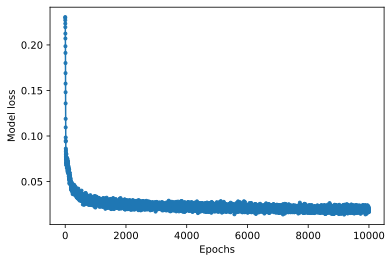

In [8]:
losses, net = trainModel()
print(f'Final loss : {losses[-1]:.4f}')

plt.plot(losses, '.-')
plt.xlabel('Epochs')
plt.ylabel('Model loss')
plt.show()

### Inspecting latent "code" of the model

In [9]:
yH, latent = net(dataT)

print(yH.shape, latent.shape)

torch.Size([20000, 784]) torch.Size([20000, 15])


In [ ]:
# what does it look like?
fig,ax = plt.subplots(1,2,figsize=(15,5))

ax[0].hist(latent.flatten().detach(),100)
ax[0].set_xlabel('Latent activation value')
ax[0].set_ylabel('Count')
ax[0].set_title('Distribution of latent units activations')

ax[1].imshow(latent.detach(),aspect='auto',vmin=0,vmax=10)
ax[1].set_xlabel('Latent node')
ax[1].set_ylabel('Image number')
ax[1].set_title('All latent activations')

plt.show()

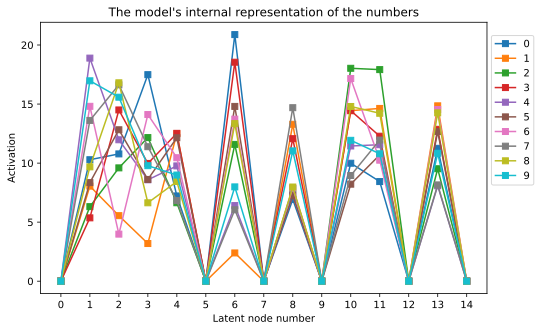

In [11]:
# computing average latent activation for each digit type
srcCode = np.zeros((latent.shape[1], 10))

# initialize output matrix
for i in range(10):
    digIdx = np.where(labels==i) # finding all pictures of a category
    
    # avg latent layer op
    srcCode[:,i] = torch.mean(latent[digIdx, :], axis=1).detach()

    # let's see what it looks like!
fig = plt.figure(figsize=(8,5))

plt.plot(srcCode,'s-')
plt.legend(range(10),loc=(1.01,.4))
plt.xticks(range(15))
plt.xlabel('Latent node number')
plt.ylabel('Activation')
plt.title("The model's internal representation of the numbers")
plt.show()    

### Exploring the reduced compressed space with PCA

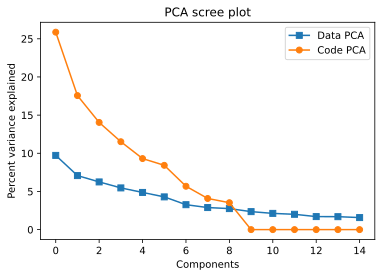

In [16]:
# computing and fitting the PCA

pcaData = PCA(n_components=15).fit(data) # 15 components to match latent
pcaCode = PCA().fit(latent.detach())

# plot the eigenspectra (scree plot)
plt.plot(100*pcaData.explained_variance_ratio_,'s-',label='Data PCA')
plt.plot(100*pcaCode.explained_variance_ratio_,'o-',label='Code PCA')
plt.xlabel('Components')
plt.ylabel('Percent variance explained')
plt.title('PCA scree plot')
plt.legend()
plt.show()

In [75]:
# compute the projection of the data onto the PC axes
scoresData = pcaData.fit_transform(data)
scoresCode = pcaCode.fit_transform(latent.detach())

# plot the data separately per number
fig,ax = plt.subplots(1,2,figsize=(15,5))

for lab in range(10):
  ax[0].plot(scoresData[labels==lab,0],scoresData[labels==lab,1],'o',markersize=3,alpha=.4)
  ax[1].plot(scoresCode[labels==lab,0],scoresCode[labels==lab,1],'o',markersize=3,alpha=.4)

for i in range(2):
  ax[i].set_xlabel('PC1 projection')
  ax[i].set_ylabel('PC2 projection')
  ax[i].legend(range(10))

ax[0].set_title('PCA of data')
ax[1].set_title('PCA of latent code')
plt.show()

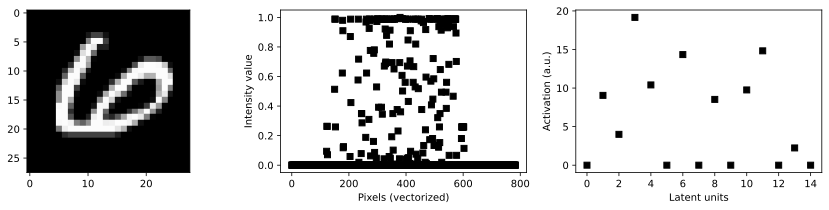

In [76]:
# This cell is not important! It's just the code I used to make the figure in the slide. I decided to leave it here FYI.

fig,ax = plt.subplots(1,3,figsize=(15,3))

ax[0].imshow(dataT[0,:].view(28,28),cmap='gray')

ax[1].plot(dataT[0,:],'ks')
ax[1].set_xlabel('Pixels (vectorized)')
ax[1].set_ylabel('Intensity value')

ax[2].plot(latent[0,:].detach(),'ks')
ax[2].set_xlabel('Latent units')
ax[2].set_ylabel('Activation (a.u.)')

plt.show()

# Auto Encoder with "Tied weights"

Tied weights - Mirroring/duplication of weights on encoder and decoder side, more like transpose.  
In Theory, forcing the decoder weights to encoder weights. In Practice, Having only one set of weights and reusing them for encoding and decoding.


In [77]:
import numpy as np
import matplotlib.pyplot as plt

import copy
import warnings
warnings.filterwarnings('ignore')

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset

from sklearn.model_selection import train_test_split

from IPython import display
display.set_matplotlib_formats('svg')

## Linear vs Parameter class

In [89]:
# creating  ip and weight matrix
x = torch.rand(10, 50)
W1 = nn.Parameter(torch.randn(128, 50)) 
# simulating the ip layer - ip that has 50 feature sis transformed to 128 units
# Above is in the format (op, ip)
W1

Parameter containing:
tensor([[-0.7997, -0.1657,  0.5692,  ...,  0.2878,  1.6766,  1.1286],
        [ 1.2200,  0.8537, -0.8721,  ...,  2.1656,  0.0989,  0.0043],
        [ 0.6050, -0.8965, -0.8631,  ...,  0.9046, -0.5334, -0.2701],
        ...,
        [-0.2704,  0.1102, -1.3182,  ...,  0.7312,  0.5951,  0.2229],
        [ 0.9483, -1.9674,  0.4781,  ...,  0.9572,  1.1258, -0.6274],
        [-2.7313, -0.6097, -0.4125,  ..., -0.0475,  0.7377, -0.3641]],
       requires_grad=True)

In [90]:
# computing op 
y = x@W1.T
y, y.shape

(tensor([[-5.1627,  5.4699,  2.2704,  ...,  1.0976,  3.9842, -0.9351],
         [-7.7724,  8.5822,  5.1470,  ...,  1.5252,  4.5673, -0.0196],
         [-7.8058,  3.3206, -1.1331,  ...,  0.5682,  1.3575,  0.2276],
         ...,
         [-7.1825,  3.7478,  4.8541,  ...,  0.6099,  1.2203,  1.8425],
         [-7.4463,  5.7138,  2.7394,  ...,  3.1671,  3.3501,  2.3161],
         [-4.5331,  5.4487,  4.7406,  ...,  0.4691,  7.0483,  3.6666]],
        grad_fn=<MmBackward0>),
 torch.Size([10, 128]))

In [92]:
# trying with nn.Linear method
W2 = nn.Linear(128,50) # same format as for nn.parameter
print(W2)  # op is different
W2.weight.shape # size of weight is however [op, ip] but nn.Linear expects [ip,op] format

Linear(in_features=128, out_features=50, bias=True)


torch.Size([50, 128])

In [94]:
dir(nn.Linear)

['T_destination',
 '__annotations__',
 '__call__',
 '__class__',
 '__constants__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattr__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setstate__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_apply',
 '_call_impl',
 '_get_backward_hooks',
 '_get_backward_pre_hooks',
 '_get_name',
 '_load_from_state_dict',
 '_maybe_warn_non_full_backward_hook',
 '_named_members',
 '_register_load_state_dict_pre_hook',
 '_register_state_dict_hook',
 '_replicate_for_data_parallel',
 '_save_to_state_dict',
 '_slow_forward',
 '_version',
 'add_module',
 'apply',
 'bfloat16',
 'buffers',
 'call_super_init',
 'children',
 'cpu',
 'cuda',
 'double',
 'dump_patches',
 'eval',
 'extra_repr',
 'float',
 'forward',
 'get_buffer',
 'get_

### Import and process data

In [112]:
data = np.loadtxt(open('../data/mnist_train_small.csv', 'rb'), delimiter=',')

labels = data[:, 0]
data = data[:, 1:]

# normalizing data to a range of 0-1

dataNorm = data/np.max(data)

dataT = torch.tensor(dataNorm).float()

In [113]:
def createMNISTAE():
    
    class AENet(nn.Module):
        def __init__(self):
            super().__init__()
            self.ip = nn.Linear(784, 128) # input layer
            
            # encoder layer using nn.Parameter  for tied weights
            self.enc = nn.Parameter(torch.randn(50, 128))
#             self.enc = nn.Linear(128, 50) # Encoder layer


#             self.lat = nn.Linear(15, 150) # latent layer

            self.dec = nn.Linear(128, 784) # decoder layer - op is same as ip
        
        def forward(self, x):
            x = F.relu(self.ip(x)) # through ip layer
            
            # need to transpose ip matrix
            x = x.t() # transpose matrix
            x = F.relu(self.enc@x) # matrix multiplication explicitly
            
            # for decoding, repeat above but reverse before passing through decoder
            x = F.relu(self.enc.t()@x)
            x = x.t()
            
            y = torch.sigmoid(self.dec(x)) # as ip data is in 0-1, op should be in same numerical range as ip, hence sigmoid
            return y           
            
    net = AENet()
    
    lossfn = nn.MSELoss()
    optim = torch.optim.Adam(net.parameters(), lr=.001)
    
    return net, lossfn, optim

In [114]:
# testing model

net = createMNISTAE()[0]

x = dataT[:5,:]
y = net(x)

print(x.shape, y.shape)

torch.Size([5, 784]) torch.Size([5, 784])


In [118]:
def trainModel():
    nEp = 10000

    net, lossfn, optim = createMNISTAE()
    losses = torch.zeros(nEp)

    for i in range(nEp):
        randIdx = np.random.choice(dataT.shape[0], size=32) # slecting a random set of images
        X = dataT[randIdx, :]

        # forward pass
        yH = net(X)
        loss = lossfn(yH, X) # data itself is a label

        # backprop
        optim.zero_grad()
        loss.backward()
        optim.step()

        losses[i] = loss.item()

    return losses, net

Final loss : 0.0158


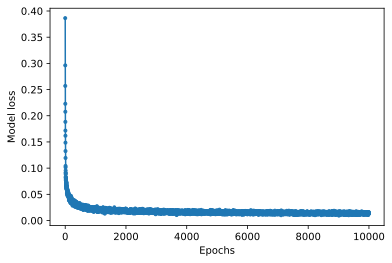

In [119]:
losses, net = trainModel()
print(f'Final loss : {losses[-1]:.4f}')

plt.plot(losses, '.-')
plt.xlabel('Epochs')
plt.ylabel('Model loss')
plt.show()

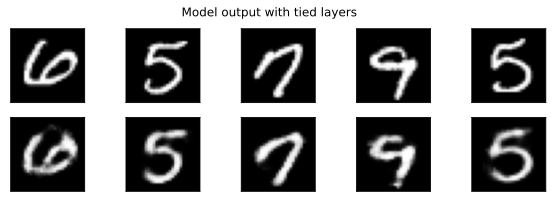

In [120]:
# Visualization of inputs and outputs
X = dataT[:5,:]
yHat = net(X)

# let's see what the model did!
fig,axs = plt.subplots(2,5,figsize=(10,3))

for i in range(5):
    axs[0,i].imshow(X[i,:].view(28,28).detach() ,cmap='gray')
    axs[1,i].imshow(yHat[i,:].view(28,28).detach() ,cmap='gray')
    axs[0,i].set_xticks([]), axs[0,i].set_yticks([])
    axs[1,i].set_xticks([]), axs[1,i].set_yticks([])

plt.suptitle('Model output with tied layers')
plt.show()

## Use case of AE with tied weights (Trying de-noising)

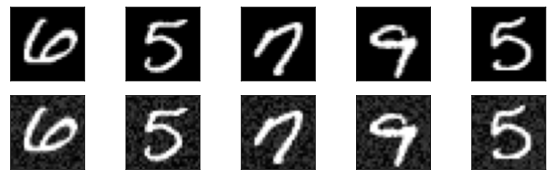

In [121]:
X = dataT[:10, :]     # selecting random images

Xnoise = X + torch.rand_like(X)/4   # adding noise to data

Xnoise[Xnoise > 1] = 1    # clipping any values > 1 to 1 after adding noise

fig,axs = plt.subplots(2,5,figsize=(10,3))

for i in range(5):
    axs[0,i].imshow(X[i,:].view(28,28).detach() ,cmap='gray')
    axs[1,i].imshow(Xnoise[i,:].view(28,28).detach() ,cmap='gray')
    axs[0,i].set_xticks([]), axs[0,i].set_yticks([])
    axs[1,i].set_xticks([]), axs[1,i].set_yticks([])
    
plt.show()

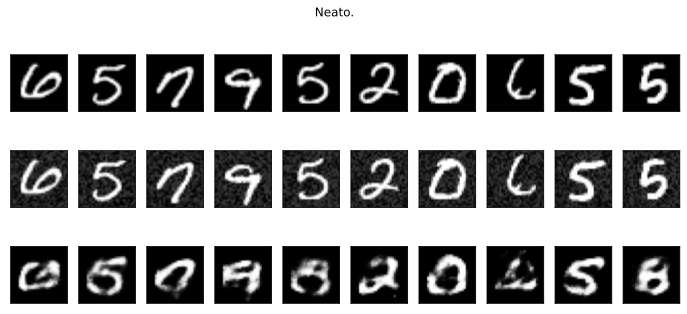

In [122]:
# running it through model

Y = net(Xnoise)

# show the noisy images
fig,axs = plt.subplots(3,10,figsize=(12,5))

for i in range(10):
    axs[0,i].imshow(X[i,:].view(28,28).detach() ,cmap='gray')
    axs[1,i].imshow(Xnoise[i,:].view(28,28).detach() ,cmap='gray')
    axs[2,i].imshow(Y[i,:].view(28,28).detach() ,cmap='gray')
    axs[0,i].set_xticks([]), axs[0,i].set_yticks([])
    axs[1,i].set_xticks([]), axs[1,i].set_yticks([])
    axs[2,i].set_xticks([]), axs[2,i].set_yticks([])

plt.suptitle('Neato.')
plt.show()

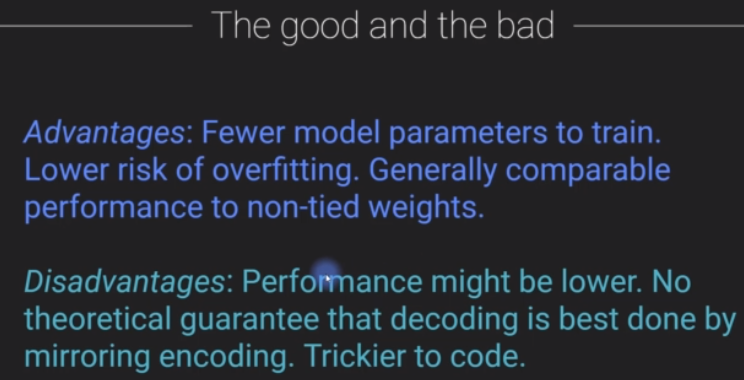